# Description

This notebook provides a first look at the FC matrices that form this data sample:

* Load all connectivity matrices

* Compute the average connectivity matrix across the whole sample

* Plot the average FC for the whole sample

* Create dashboard to fastly explore all the individual scan FC matrices

In [21]:
import pandas as pd
import xarray as xr
import numpy as np
import os.path as osp
import hvplot.pandas
from tqdm import tqdm
#import holoviews as hv
from utils.basics import get_sbj_scan_list
from scipy.spatial.distance import squareform
from utils.basics import DATA_DIR, ATLAS_NAME, ATLASES_DIR
from utils.plotting import hvplot_fc, plot_fc
from sfim_lib.io.afni import load_netcc
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import cosine, euclidean, correlation
import panel as pn

In [25]:
import os
port_tunnel = int(os.environ['PORT2'])
print('++ INFO: Second Port available: %d' % port_tunnel)

++ INFO: Second Port available: 37272


# 1. Load the final list of scans used in this project

In [2]:
sbj_list, scan_list = get_sbj_scan_list(when='post_motion', return_snycq=False)

++ [post_motion] Number of subjects: 133 subjects
++ [post_motion] Number of scans:    471 scans


# 2. Load information about the Atlas and ROI needed for plotting

In [3]:
ATLASINFO_PATH = osp.join(ATLASES_DIR,ATLAS_NAME,'{ATLAS_NAME}_order_FSLMNI152_2mm.ranked.roi_info.csv'.format(ATLAS_NAME=ATLAS_NAME))
roi_info      = pd.read_csv(ATLASINFO_PATH)

# 3. Load into memory all individual scan FC matrices

We will place the matrices in two separate xr.DataArray data structures. One will hold the matrices in terms of Pearson's correlation (```all_sfc_R```) and the other one in terms of their Fisher's transform (```all_sfc_Z```). In the first cell below, we create empty versions of these two data structures. These empty data structures will get populated in the subsequent cell.

In [4]:
# Create empty Xr Data Array to hold all FC matrices
all_sfc_R_orig = xr.DataArray(dims=['Scan','ROI1','ROI2'], 
                         coords={'Scan':[sbj+'|'+run for sbj,run in scan_list],
                               'ROI1':roi_info['ROI_Name'].values,
                               'ROI2':roi_info['ROI_Name'].values})

In [5]:
%%time
all_rois = list(roi_info['ROI_Name'].values)
# Load all matrices
for sbj,run in tqdm(scan_list):
    _,_,_,_,run_num,_,run_acq = run.split('-')
    netcc_path = osp.join(DATA_DIR,'PrcsData',sbj,'preprocessed','func','pb06_staticFC','{run_acq}_run-{run_num}.{ATLAS_NAME}_000.netcc'.format(run_acq = run_acq, run_num = run_num, ATLAS_NAME = ATLAS_NAME))
    netcc      = load_netcc(netcc_path)
    this_scan_rois = [ item.strip().strip('7Networks_') for item in list(netcc.columns)]
    all_sfc_R_orig.loc[sbj+'|'+run,:,:] = netcc

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 471/471 [00:04<00:00, 96.31it/s]

CPU times: user 4.28 s, sys: 587 ms, total: 4.87 s
Wall time: 4.89 s


# 4. Zscore the individual matrices

In [6]:
Nrois  = len(all_rois)
Nconns = int(Nrois * (Nrois-1) / 2)
all_sfc_R_orig_VECT = pd.DataFrame(index=np.arange(Nconns),columns=[sbj+'|'+run for sbj,run in scan_list])
for sbj,run in tqdm(scan_list):
    scan_label          = sbj+'|'+run 
    this_scan_fc_matrix = all_sfc_R_orig.loc[scan_label].values
    np.fill_diagonal(this_scan_fc_matrix,0)
    this_scan_fc_vector = squareform(this_scan_fc_matrix)
    all_sfc_R_orig_VECT[scan_label] = this_scan_fc_vector

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 471/471 [00:13<00:00, 36.05it/s]


In [7]:
all_sfc_R_scaled_VECT = all_sfc_R_orig_VECT.apply(zscore)
print(all_sfc_R_scaled_VECT.mean()[0],all_sfc_R_scaled_VECT.std()[0])

1.7428030919594488e-17 1.0000287517430801


### Transformed normalized matrixes from VECT to matrix form

In [8]:
all_sfc_R_scaled = xr.DataArray(dims=['Scan','ROI1','ROI2'], 
                         coords={'Scan':[sbj+'|'+run for sbj,run in scan_list],
                               'ROI1':roi_info['ROI_Name'].values,
                               'ROI2':roi_info['ROI_Name'].values})

In [9]:
# Load all matrices
for sbj,run in tqdm(scan_list):
    scan_label = sbj+'|'+run
    aux = squareform(all_sfc_R_scaled_VECT[scan_label])
    np.fill_diagonal(aux,1)
    all_sfc_R_scaled.loc[scan_label,:,:] = aux

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 471/471 [00:00<00:00, 1883.31it/s]


# 5. Compute the sample mean

In [10]:
REFERENCE_scaled_fc = all_sfc_R_scaled.mean(dim='Scan').values

In [11]:
# Create a vectorized version of the sample mean FC
np.fill_diagonal(REFERENCE_scaled_fc,0)
REFERENCE_scaled_fc_VECT = squareform(REFERENCE_scaled_fc)
assert Nconns == len(REFERENCE_scaled_fc_VECT)

In [12]:
hvplot_fc(REFERENCE_scaled_fc, ATLASINFO_PATH, cbar_title='SCALED | Average FC for the whole sample', clim=(-1.5,1.5))

:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .HLine.XII   :HLine   [x,y]
   .VLine.XII   :VLine   [x,y]
   .HLine.XIII  :HLine   [x,y]
   .VLine.XIII  :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Hemispheres)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)

# 6. Compute Similarity to REF (corr, cov, cosine) and get sorted lists of scans

In [13]:
corr_to_REFERENCE    = all_sfc_R_scaled_VECT.corrwith(pd.Series(REFERENCE_scaled_fc_VECT))
corr_to_REFERENCE.name = 'R'

In [14]:
cov_to_REFERENCE = pd.Series(dtype=float)
for sbj,run in scan_list:
    scan_label = sbj+'|'+run
    aux        = all_sfc_R_scaled_VECT[scan_label]
    cov_to_REFERENCE[scan_label] = np.cov(REFERENCE_scaled_fc_VECT,aux)[0,1]
cov_to_REFERENCE.name = 'Covariance'

In [18]:
cos_to_REFERENCE = pd.Series(dtype=float)
for sbj,run in scan_list:
    scan_label = sbj+'|'+run
    aux        = all_sfc_R_scaled_VECT[scan_label]
    cos_to_REFERENCE[scan_label] = cosine(REFERENCE_scaled_fc_VECT,aux)
cos_to_REFERENCE.name = 'Cosine'

In [19]:
scan_list_sorted={'none':['|'.join([sbj,run]) for sbj,run in scan_list],
                  'cosine':list(cos_to_REFERENCE.sort_values(ascending=False).index),
                  'correlation':list(corr_to_REFERENCE.sort_values(ascending=False).index),
                  'covariance':list(cov_to_REFERENCE.sort_values(ascending=False).index)}

In [30]:
sort_method_select = pn.widgets.Select(name='Sort Method', options=list(scan_list_sorted.keys()), value='none')
@pn.depends(sort_method_select)
def plot_carpet(sorting_method):
    fig, ax = plt.subplots(1,1,figsize=(20,5))
    plot = sns.heatmap(all_sfc_R_scaled_VECT[scan_list_sorted[sorting_method]],cmap='RdBu_r', vmin=-1.5, vmax=1.5, xticklabels=False, yticklabels=False)
    plot.set_xlabel('Scans', fontsize=14)
    plot.set_ylabel('Connections', fontsize=14)
    plt.close()
    return fig
dashboard01 = pn.Column(sort_method_select,plot_carpet)

In [33]:
dashboard01_server = dashboard01.show(port=port_tunnel,open=False)

Launching server at http://localhost:37272


In [34]:
dashboard01_server.stop()

# 7. Plot Distribution of correlatations towards the REFERENCE

In [35]:
(corr_to_REFERENCE.hvplot.hist(bins=50, normed=True, title='Corr(Scan,REF)', xlabel='Correlation to Sample Mean', ylabel='Distribution', fontsize=14, xlim=(0,1), width=500) \
* corr_to_REFERENCE.hvplot.kde()) + \
(cov_to_REFERENCE.hvplot.hist(bins=50, normed=True, title='Cov(Scan,REF)', xlabel='Covariance to Sample Mean', ylabel='Distribution', fontsize=14, width=500) \
* cov_to_REFERENCE.hvplot.kde()) + \
(cos_to_REFERENCE.hvplot.hist(bins=50, normed=True, title='Cosine(Scan,REF)', xlabel='Covariance to Sample Mean', ylabel='Distribution', fontsize=14, width=500) \
* cos_to_REFERENCE.hvplot.kde())

:Layout
   .Overlay.I   :Overlay
      .Histogram.I    :Histogram   [R]   (R_frequency)
      .Distribution.I :Distribution   [R]   (Density)
   .Overlay.II  :Overlay
      .Histogram.I    :Histogram   [Covariance]   (Covariance_frequency)
      .Distribution.I :Distribution   [Covariance]   (Density)
   .Overlay.III :Overlay
      .Histogram.I    :Histogram   [Cosine]   (Cosine_frequency)
      .Distribution.I :Distribution   [Cosine]   (Density)

# 8. Generate dashboard to explore all individual scan FC matrices

> **NOTE**: If you run the code within the notebook, the dashboard does not update when you hit play. Make sure to open it by clicking on the URL that the show command below returns

In [38]:
# This is needed to ensure the labels are not cut when serving the matplotlib figures via pn.Column
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

In [46]:
Nscans          = len(scan_list)
scan_selector   = pn.widgets.Player(name='Scan Number', start=0, end=Nscans-1, value=0, width=700)
@pn.depends(scan_selector,sort_method_select)
def plot_one_scan(scan_num,sorting_method):
    aux_scan_list             = scan_list_sorted[sorting_method]
    scan_name                 = aux_scan_list[scan_num]
    sbj, run                  = scan_name.split('|')
    _,_,_,_,run_num,_,run_acq = (run).split('-')
    scan_label = sbj + ',' + run_num+'_'+run_acq + ' | R = %.3f' % corr_to_REFERENCE[scan_name] + ' | Cos = %.3f' % cos_to_REFERENCE[scan_name] + ' | Cov = %.3f' % cov_to_REFERENCE[scan_name]
    data = all_sfc_R_scaled.loc[scan_name].values
    fig  = plot_fc(data,ATLASINFO_PATH, figsize=(10,10),clim=(-1.5,1.5))
    return pn.Card(pn.pane.Matplotlib(fig),title=scan_label,collapsible=False)

In [47]:
dashboard = pn.Column(sort_method_select,scan_selector,plot_one_scan)

In [48]:
dashboard_server = dashboard.show(port=port_tunnel,open=False)

Launching server at http://localhost:37272


In [49]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

# 6. Compute Similarity between each scan FC matrix and the sample mean

In [13]:
# Create a vectorized version of the sample mean FC
np.fill_diagonal(all_mean_fc,0)
all_mean_fc_asvector = squareform(all_mean_fc)
assert Nconns == len(all_mean_fc_asvector)

In [14]:
corr_to_sample_mean = all_sfc_R_scaled_VECT.corrwith(pd.Series(all_mean_fc_asvector))

In [15]:
corr_to_sample_mean.hvplot.hist(bins=50, normed=True, title='Similarity to Sample Average', xlabel='Correlation to Sample Mean', ylabel='Distribution', fontsize=14, xlim=(0,1), width=500) \
* corr_to_sample_mean.hvplot.kde(bins=50)

:Overlay
   .Histogram.I    :Histogram   [0]   (0_frequency)
   .Distribution.I :Distribution   [0]   (Density)

Text(239.58333333333334, 0.5, 'Connections')

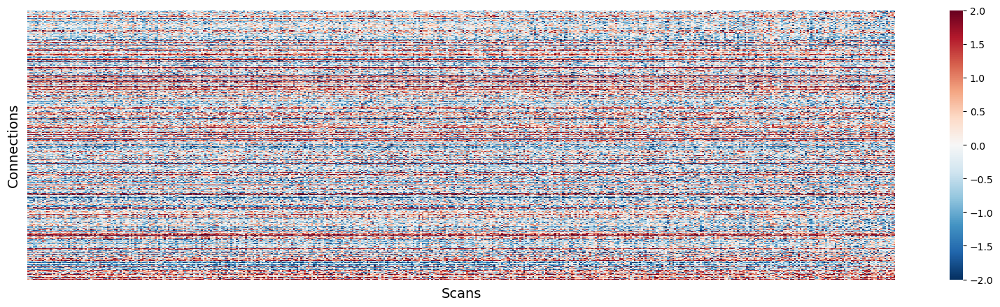

In [16]:
fig, ax = plt.subplots(1,1,figsize=(20,5))
plot = sns.heatmap(all_sfc_R_scaled_VECT[list(corr_to_sample_mean.sort_values(ascending=False).index)],cmap='RdBu_r', vmin=-2, vmax=2, xticklabels=False, yticklabels=False)
plot.set_xlabel('Scans', fontsize=14)
plot.set_ylabel('Connections', fontsize=14)

# 6. Generate dashboard to explore all individual scan FC matrices

> **NOTE**: If you run the code within the notebook, the dashboard does not update when you hit play. Make sure to open it by clicking on the URL that the show command below returns

In [17]:
import panel as pn
import time
# This is needed to ensure the labels are not cut when serving the matplotlib figures via pn.Column
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

In [18]:
scan_list_sorted_by_similarity2samplemean = [tuple(item[0].split('|')) for item in corr_to_sample_mean.sort_values(ascending=False).iteritems()]

In [19]:
Nscans          = len(scan_list)
scan_selector   = pn.widgets.Player(name='Scan Number', start=0, end=Nscans, value=0, width=700)
sorted_checkbox = pn.widgets.Checkbox(name='Sort by Similarity to Sample Mean', value=False)
@pn.depends(scan_selector,sorted_checkbox)
def plot_one_scan(scan_num,sorted_to_mean):
    if sorted_to_mean:
        scan_list_to_use = scan_list_sorted_by_similarity2samplemean
    else:
        scan_list_to_use = scan_list
    scan_name  = scan_list_to_use[scan_num][0]+'|'+scan_list_to_use[scan_num][1]
    scan_label = scan_list_to_use[scan_num][0] + ' | '+scan_list_to_use[scan_num][1] + ' | R2SampleMean = %.4f' % corr_to_sample_mean[scan_name]
    data = all_sfc_R_scaled.loc[scan_name].values
    fig  = plot_fc(data,ATLASINFO_PATH, figsize=(10,10), clim=(-1.5,1.5))
    return pn.Card(pn.pane.Matplotlib(fig),title=scan_label,collapsible=False)

In [20]:
dashboard = pn.Column(pn.Row(sorted_checkbox,scan_selector),plot_one_scan)

In [21]:
import os
port_tunnel = int(os.environ['PORT2'])
print('++ INFO: Second Port available: %d' % port_tunnel)

dashboard_server = dashboard.show(port=port_tunnel,open=False)

++ INFO: Second Port available: 37272
Launching server at http://localhost:37272


In [22]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

In [23]:
from scipy.spatial.distance import pdist

<AxesSubplot:>

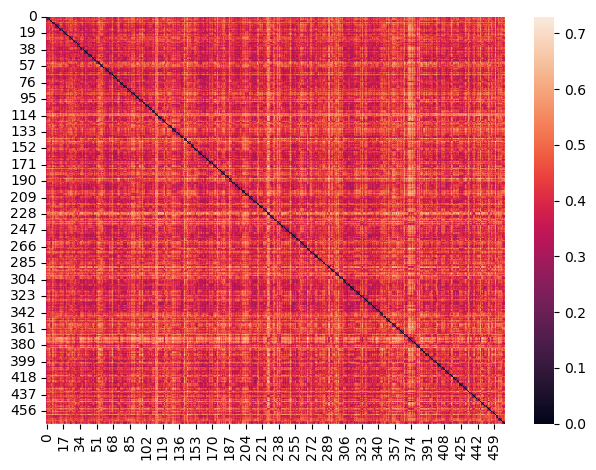

In [30]:
sns.heatmap(squareform(pdist(all_sfc_R_scaled_VECT.T, 'correlation')))

# 5. Compute Similarity between each scan FC matrix and the sample mean

In [8]:
Nrois  = all_mean_fc.shape[0]
Nconns = int(Nrois * (Nrois-1) / 2)

In [9]:
# Create a vectorized version of the sample mean FC
np.fill_diagonal(all_mean_fc,0)
all_mean_fc_asvector = squareform(all_mean_fc)
assert Nconns == len(all_mean_fc_asvector)

In [10]:
all_sfc_R_vectorized = pd.DataFrame(index=np.arange(Nconns),columns=[sbj+'|'+run for sbj,run in scan_list])
for sbj,run in tqdm(scan_list):
    scan_label          = sbj+'|'+run 
    this_scan_fc_matrix = all_sfc_R.loc[scan_label].values
    np.fill_diagonal(this_scan_fc_matrix,0)
    this_scan_fc_vector = squareform(this_scan_fc_matrix)
    all_sfc_R_vectorized[scan_label] = this_scan_fc_vector

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 471/471 [00:12<00:00, 36.26it/s]


In [11]:
corr_to_sample_mean = all_sfc_R_vectorized.corrwith(pd.Series(all_mean_fc_asvector))

In [35]:
(corr_to_REFERENCE.hvplot.hist(bins=50, normed=True, title='Corr(Scan,REF)', xlabel='Correlation to Sample Mean', ylabel='Distribution', fontsize=14, xlim=(0,1), width=500) \
* corr_to_REFERENCE.hvplot.kde()) + \
(cov_to_REFERENCE.hvplot.hist(bins=50, normed=True, title='Cov(Scan,REF)', xlabel='Covariance to Sample Mean', ylabel='Distribution', fontsize=14, width=500) \
* cov_to_REFERENCE.hvplot.kde()) + \
(cos_to_REFERENCE.hvplot.hist(bins=50, normed=True, title='Cosine(Scan,REF)', xlabel='Covariance to Sample Mean', ylabel='Distribution', fontsize=14, width=500) \
* cos_to_REFERENCE.hvplot.kde())

:Layout
   .Overlay.I   :Overlay
      .Histogram.I    :Histogram   [R]   (R_frequency)
      .Distribution.I :Distribution   [R]   (Density)
   .Overlay.II  :Overlay
      .Histogram.I    :Histogram   [Covariance]   (Covariance_frequency)
      .Distribution.I :Distribution   [Covariance]   (Density)
   .Overlay.III :Overlay
      .Histogram.I    :Histogram   [Cosine]   (Cosine_frequency)
      .Distribution.I :Distribution   [Cosine]   (Density)

# 6. Generate dashboard to explore all individual scan FC matrices

> **NOTE**: If you run the code within the notebook, the dashboard does not update when you hit play. Make sure to open it by clicking on the URL that the show command below returns

In [38]:
import panel as pn
import time
# This is needed to ensure the labels are not cut when serving the matplotlib figures via pn.Column
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

In [39]:
scan_list_sorted_by_similarity2samplemean = [tuple(item[0].split('|')) for item in corr_to_sample_mean.sort_values(ascending=False).iteritems()]

In [40]:
Nscans          = len(scan_list)
scan_selector   = pn.widgets.Player(name='Scan Number', start=0, end=Nscans, value=0, width=700)
sorted_checkbox = pn.widgets.Checkbox(name='Sort by Similarity to Sample Mean', value=False)
@pn.depends(scan_selector,sorted_checkbox)
def plot_one_scan(scan_num,sorted_to_mean):
    if sorted_to_mean:
        scan_list_to_use = scan_list_sorted_by_similarity2samplemean
    else:
        scan_list_to_use = scan_list
    scan_name  = scan_list_to_use[scan_num][0]+'|'+scan_list_to_use[scan_num][1]
    scan_label = scan_list_to_use[scan_num][0] + ' | '+scan_list_to_use[scan_num][1] + ' | R2SampleMean = %.2f' % corr_to_sample_mean[scan_name]
    data = all_sfc_R.loc[scan_name].values
    fig  = plot_fc(data,ATLASINFO_PATH, figsize=(10,10))
    return pn.Card(pn.pane.Matplotlib(fig),title=scan_label,collapsible=False)
    #return pn.Column(pn.pane.Markdown('## {title}'.format(title=str(scan_num)+' -> '+scan_name)),pn.pane.Matplotlib(fig))

In [41]:
dashboard = pn.Column(pn.Row(sorted_checkbox,scan_selector),plot_one_scan)

In [42]:
import os
port_tunnel = int(os.environ['PORT2'])
print('++ INFO: Second Port available: %d' % port_tunnel)

dashboard_server = dashboard.show(port=port_tunnel,open=False)

++ INFO: Second Port available: 37272
Launching server at http://localhost:37272
2023-01-25 16:17:39,143 ERROR: panel.reactive - Callback failed for object named "Scan Number" changing property {'value': 471} 
Traceback (most recent call last):
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/panel/reactive.py", line 319, in _process_events
    self.param.update(**self_events)
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/param/parameterized.py", line 1902, in update
    self_._batch_call_watchers()
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/param/parameterized.py", line 2063, in _batch_call_watchers
    self_._execute_watcher(watcher, events)
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/param/parameterized.py", line 2025, in _execute_watcher
    watcher.fn(*args, **kwargs)
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3

ERROR:tornado.application:Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <tornado.platform.asyncio.AsyncIOMainLoop object at 0x2aaab4e9abd0>>, <Task finished coro=<ServerSession.with_document_locked() done, defined at /data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/bokeh/server/session.py:78> exception=IndexError('list index out of range')>)
Traceback (most recent call last):
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/tornado/ioloop.py", line 740, in _run_callback
    ret = callback()
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/tornado/ioloop.py", line 764, in _discard_future_result
    future.result()
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/bokeh/server/session.py", line 99, in _needs_document_lock_wrapper
    result = await result
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7

2023-01-25 16:17:52,295 ERROR: panel.reactive - Callback failed for object named "Scan Number" changing property {'value': 471} 
Traceback (most recent call last):
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/panel/reactive.py", line 319, in _process_events
    self.param.update(**self_events)
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/param/parameterized.py", line 1902, in update
    self_._batch_call_watchers()
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/param/parameterized.py", line 2063, in _batch_call_watchers
    self_._execute_watcher(watcher, events)
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/param/parameterized.py", line 2025, in _execute_watcher
    watcher.fn(*args, **kwargs)
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/panel/param.py", line 842, in _replace_pane
    new_object = sel

ERROR:tornado.application:Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <tornado.platform.asyncio.AsyncIOMainLoop object at 0x2aaab4e9abd0>>, <Task finished coro=<ServerSession.with_document_locked() done, defined at /data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/bokeh/server/session.py:78> exception=IndexError('list index out of range')>)
Traceback (most recent call last):
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/tornado/ioloop.py", line 740, in _run_callback
    ret = callback()
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/tornado/ioloop.py", line 764, in _discard_future_result
    future.result()
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7/site-packages/bokeh/server/session.py", line 99, in _needs_document_lock_wrapper
    result = await result
  File "/data/SFIMJGC_HCP7T/Apps/envs/fc_introspection/lib/python3.7

In [37]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

# 8. Explore the similarity profile of matrices

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

Text(4.5833333333333375, 0.5, 'Connections')

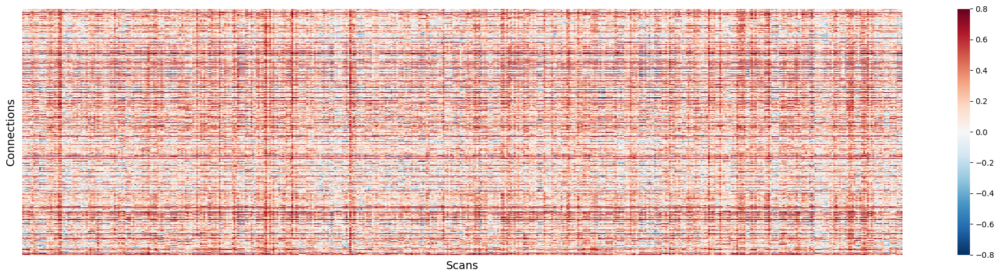

In [44]:
fig, ax = plt.subplots(1,1,figsize=(20,5))
plot = sns.heatmap(all_sfc_R_vectorized,cmap='RdBu_r', vmin=-.8, vmax=.8, xticklabels=False, yticklabels=False)
plot.set_xlabel('Scans', fontsize=14)
plot.set_ylabel('Connections', fontsize=14)

### Show the matrix most different to the sample mean

In [78]:
most_different_scan      = corr_to_sample_mean.sort_values().index[0]
most_different_scan_corr = corr_to_sample_mean.sort_values()[0]
print('INFO: Most dissimilar scan to the sample mean [%s --> R(scan,mean) = %.2f ]' % (most_different_scan,most_different_scan_corr))
most_different_matrix = all_sfc_R.loc[most_different_scan,:,:].values
np.fill_diagonal(most_different_matrix,1)
hvplot_fc(most_different_matrix, ATLASINFO_PATH)

INFO: Most dissimilar scan to the sample mean [sub-010023|post-ses-02-run-01-acq-PA --> R(scan,mean) = 0.62 ]


:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .HLine.XII   :HLine   [x,y]
   .VLine.XII   :VLine   [x,y]
   .HLine.XIII  :HLine   [x,y]
   .VLine.XIII  :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Hemispheres)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)

### Show the matrix most similar to the sample mean

In [79]:
most_similar_scan      = corr_to_sample_mean.sort_values(ascending=False).index[0]
most_similar_scan_corr = corr_to_sample_mean.sort_values(ascending=False)[0]
print('INFO: Most dissimilar scan to the sample mean [%s --> R(scan,mean) = %.2f ]' % (most_similar_scan,most_similar_scan_corr))
most_similar_matrix = all_sfc_R.loc[most_similar_scan,:,:].values
np.fill_diagonal(most_similar_matrix,1)
hvplot_fc(most_similar_matrix, ATLASINFO_PATH)

INFO: Most dissimilar scan to the sample mean [sub-010210|post-ses-02-run-01-acq-PA --> R(scan,mean) = 0.85 ]


:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .HLine.XII   :HLine   [x,y]
   .VLine.XII   :VLine   [x,y]
   .HLine.XIII  :HLine   [x,y]
   .VLine.XIII  :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Hemispheres)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)

In [86]:
median_selector          = corr_to_sample_mean[corr_to_sample_mean==corr_to_sample_mean.median()]
median_similar_scan      = median_selector.index[0]
median_similar_scan_corr = median_selector.values
print('INFO: Scan with median similarity to the sample mean [%s --> R(scan,mean) = %.2f ]' % (median_similar_scan,median_similar_scan_corr))
median_similar_matrix = all_sfc_R.loc[median_similar_scan,:,:].values
np.fill_diagonal(median_similar_matrix,1)
hvplot_fc(median_similar_matrix, ATLASINFO_PATH)

INFO: Scan with median similarity to the sample mean [sub-010167|post-ses-02-run-01-acq-PA --> R(scan,mean) = 0.76 ]


:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .HLine.XII   :HLine   [x,y]
   .VLine.XII   :VLine   [x,y]
   .HLine.XIII  :HLine   [x,y]
   .VLine.XIII  :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Hemispheres)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)

In [51]:
all_sfc_R_vectorized.mean().hvplot() + all_sfc_R_vectorized.std().hvplot()

:Layout
   .Curve.A_0.I  :Curve   [index]   (0)
   .Curve.A_0.II :Curve   [index]   (0)

In [58]:
df = pd.concat([all_sfc_R_vectorized.mean(), all_sfc_R_vectorized.std()],axis=1)
df.columns = ['Mean','Stdv']
df.hvplot.scatter(x='Mean',y='Stdv', aspect='square')

:Scatter   [Mean]   (Stdv)

In [61]:
from scipy.stats import zscore
all_sfc_R_vectorized_zscored = all_sfc_R_vectorized.apply(zscore)

In [62]:
all_sfc_R_vectorized_zscored.mean().hvplot() + all_sfc_R_vectorized_zscored.std().hvplot()

:Layout
   .Curve.A_0.I  :Curve   [index]   (0)
   .Curve.A_0.II :Curve   [index]   (0)

In [67]:
a = squareform(all_sfc_R_vectorized_zscored['sub-010014|post-ses-02-run-01-acq-AP'])
np.fill_diagonal(a,1)

In [73]:
hvplot_fc(a,ATLASINFO_PATH, clim=(-2,2))

:Overlay
   .HeatMap.I   :HeatMap   [columns,index]   (value)
   .HLine.I     :HLine   [x,y]
   .VLine.I     :VLine   [x,y]
   .HLine.II    :HLine   [x,y]
   .VLine.II    :VLine   [x,y]
   .HLine.III   :HLine   [x,y]
   .VLine.III   :VLine   [x,y]
   .HLine.IV    :HLine   [x,y]
   .VLine.IV    :VLine   [x,y]
   .HLine.V     :HLine   [x,y]
   .VLine.V     :VLine   [x,y]
   .HLine.VI    :HLine   [x,y]
   .VLine.VI    :VLine   [x,y]
   .HLine.VII   :HLine   [x,y]
   .VLine.VII   :VLine   [x,y]
   .HLine.VIII  :HLine   [x,y]
   .VLine.VIII  :VLine   [x,y]
   .HLine.IX    :HLine   [x,y]
   .VLine.IX    :VLine   [x,y]
   .HLine.X     :HLine   [x,y]
   .VLine.X     :VLine   [x,y]
   .HLine.XI    :HLine   [x,y]
   .VLine.XI    :VLine   [x,y]
   .HLine.XII   :HLine   [x,y]
   .VLine.XII   :VLine   [x,y]
   .HLine.XIII  :HLine   [x,y]
   .VLine.XIII  :VLine   [x,y]
   .Segments.I  :Segments   [x0,y0,x1,y1]   (Hemispheres)
   .Segments.II :Segments   [x0,y0,x1,y1]   (Networks)